In [1]:
import json
import random
import numpy as np
from pycocotools.coco import COCO
import skimage.io as io
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.patches import Polygon
import matplotlib.colors as mcolors
import pylab
from tqdm import tqdm
import multiprocessing
import concurrent.futures
import torch
import torchvision.ops.boxes as bops

In [2]:
# Criterion for selecting images
min_area = 32**2 # min annotation area in px
aspect_ratio_range = [1/5, 5] # aspect ratio of image
box_clipping_edge_thres = 5 # boxes within 5 px of the edges
max_iou_intersection = 0.2 # segmentation should not have iou intersection with other masks

In [4]:
# Path for annotations
annFile = "/localdisk/data1/Data/COCO/annotations_trainval2017/annotations/instances_train2017.json"
coco=COCO(annFile)
# Number of reference images per category
n_ref = 10
# Save the selected annotations to a new JSON file
# if select_high_area:
#     selected_annotations_path = f"/localdisk/data2/Users/s2254242/datasets/coco/precompute_{n_ref}_shot_annotations_ref_by_area.json"    
# else:
#     selected_annotations_path = f"/localdisk/data2/Users/s2254242/datasets/coco/precompute_{n_ref}_shot_annotations_ref.json"

loading annotations into memory...
Done (t=27.94s)
creating index...
index created!


In [5]:
# Load JSON file
with open(annFile, 'r') as f:
    data = json.load(f)

In [6]:
# Access annotations
images = data['images']
annotations = data['annotations']
categories = data['categories']

In [7]:
# cat_id = [int(cat['id']) for cat in categories]
# print("Missing categories:", set(list(range(1,90))) - set(cat_id))

In [8]:
# print("Example image data:", len(images))
# print(images[0])

# print("Example annotation data:", len(annotations))
# print(annotations[0])

# print("Example category data:", len(categories))
# print(categories[0])

In [9]:
# for a in annotations:
#     if a['image_id'] == 452700:
#         print(a['category_id'])

In [10]:
# selected_annotations[67]

In [11]:
# if select_high_area:
#     annIds = coco.getAnnIds(iscrowd=None)
#     anns = coco.loadAnns(annIds)
#     annotations = sorted(anns, key=lambda x: x['area'], reverse=True)

In [12]:
# Initialize a dictionary to store selected annotations
selected_annotations = {category['id']: [] for category in categories}
selected_images = {category['id']: [] for category in categories}

# (Optional) shuffle the original annotations to ensure randomness
# To use seed do: random.Random(seed).shuffle(x)
# random.shuffle(original_annotations)

already_selected_imgs = []
images_dict = {image['id']:image for image in images} # find image by its id


# Select n_ref distinct annotations for each category
# Use n_ref * len(categories) distinct images
for annotation in annotations:
    category_id = annotation['category_id']
    image_id = annotation['image_id']
    if (len(selected_annotations[category_id]) < n_ref) \
                and (image_id not in already_selected_imgs) \
                and annotation['iscrowd'] == 0:
        selected_annotations[category_id].append(annotation)
        selected_images[category_id].append(images_dict[image_id])
        already_selected_imgs.append(image_id)

    # Check if we have selected 5 annotations for each category
    if all(len(annotations) == 5 for annotations in selected_annotations.values()):
        break

In [13]:
# Check that all the images are different (even for distinct categories)
ann_image_ids = [ann['image_id'] for c in selected_annotations for ann in selected_annotations[c]]
image_ids = [image['id'] for c in selected_images for image in selected_images[c]]
print(f"Total num of ann_ids: {len(ann_image_ids)}, Total num of unique ann_ids: {len(np.unique(ann_image_ids))}")
print(f"Total num of img_ids: {len(image_ids)}, Total num of unique img_ids: {len(np.unique(image_ids))}")
for c in selected_annotations:
    ids_class = [ann['id'] for ann in selected_annotations[c]]
    assert len(np.unique(ids_class)) == len(ids_class)
# assert len(ids) == len(np.unique(ids))

Total num of ann_ids: 800, Total num of unique ann_ids: 800
Total num of img_ids: 800, Total num of unique img_ids: 800


In [14]:
# Check imgs and anns correspond
for img_id, ann_img_id in zip(image_ids,ann_image_ids):
    assert img_id == ann_img_id

In [13]:
# Create a new JSON object following the same format as the original COCO annotations file
selected_data = {
    "info": data['info'],
    "licenses": data['licenses'],
    "images": [image for images in selected_images.values() for image in images], # dict to list
    "annotations": [annotation for annotations in selected_annotations.values() for annotation in annotations], # dict to list
    "categories": data['categories']
}

In [14]:
# Uncomment below to save
# with open(selected_annotations_path, 'w') as f:
#     json.dump(selected_data, f)

In [497]:
selected_images

{1: [{'license': 4,
   'file_name': '000000537548.jpg',
   'coco_url': 'http://images.cocodataset.org/train2017/000000537548.jpg',
   'height': 480,
   'width': 640,
   'date_captured': '2013-11-15 14:00:06',
   'flickr_url': 'http://farm9.staticflickr.com/8318/8030932453_993ab0c74b_z.jpg',
   'id': 537548},
  {'license': 4,
   'file_name': '000000117891.jpg',
   'coco_url': 'http://images.cocodataset.org/train2017/000000117891.jpg',
   'height': 427,
   'width': 640,
   'date_captured': '2013-11-15 14:46:14',
   'flickr_url': 'http://farm1.staticflickr.com/121/256249222_f4c8375c29_z.jpg',
   'id': 117891},
  {'license': 5,
   'file_name': '000000120021.jpg',
   'coco_url': 'http://images.cocodataset.org/train2017/000000120021.jpg',
   'height': 480,
   'width': 640,
   'date_captured': '2013-11-15 14:39:22',
   'flickr_url': 'http://farm8.staticflickr.com/7358/9594182155_00cb885338_z.jpg',
   'id': 120021},
  {'license': 3,
   'file_name': '000000209468.jpg',
   'coco_url': 'http://im

# Check iou_segm and iou_bbox and visualisations

In [15]:
def calculate_iou_segm(gt_ann_id, pred_ann_id):
    gt_mask = coco.annToMask(gt_ann_id)
    pred_mask = coco.annToMask(pred_ann_id)
    overlap = pred_mask * gt_mask  # Logical AND
    union = (pred_mask + gt_mask) > 0  # Logical OR
    iou = overlap.sum() / float(union.sum())
    return iou

In [16]:
def check_iou_segm(annotation):
    all_ann_ids = coco.getAnnIds(imgIds=annotation['image_id'])
    all_ann_ids.remove(annotation['id'])
    image_annotations = coco.loadAnns(all_ann_ids)
    ious = [calculate_iou_segm(annotation, ann_id) for ann_id in image_annotations]
    print(ious)
    if any(iou > 0.2 for iou in ious):
        return False
    return True

In [17]:
def convert_bbox_coco_to_x1x2y1y2(bbox):
    return [bbox[0], bbox[1], bbox[0]+bbox[2], bbox[1]+bbox[3]]

In [18]:
def check_iou_bbox(annotation):
    all_ann_ids = coco.getAnnIds(imgIds=annotation['image_id'])
    all_ann_ids.remove(annotation['id'])
    boxes1_coco = [annotation['bbox']]
    boxes2_coco = [coco.loadAnns(ann_id)[0]['bbox'] for ann_id in all_ann_ids]
    boxes1 = torch.tensor([convert_bbox_coco_to_x1x2y1y2(box1) for box1 in boxes1_coco])
    boxes2 = torch.tensor([convert_bbox_coco_to_x1x2y1y2(box2) for box2 in boxes2_coco])
    
    ious = bops.box_iou(boxes1, boxes2)
    print(ious)
    if ious.max() > 0.2:
        return False
    return True

In [19]:
chosen_ann = annotations[30]
print("BBOX", check_iou_bbox(chosen_ann))
print("SEGM", check_iou_segm(chosen_ann))

NameError: name 'torch' is not defined

In [ ]:
img = coco.loadImgs(chosen_ann['image_id'])[0]
anns_ids = coco.getAnnIds(imgIds=img['id'])
anns_ids.remove(chosen_ann['id'])
anns = coco.loadAnns(anns_ids)
I = io.imread(img['coco_url'])

fig, ax = plt.subplots()
ax.imshow(I)
plt.axis('off')

colors_list = [i for i in mcolors.XKCD_COLORS.keys() if 'red' not in i]

# Plot segmentation masks on the image
for ann, color in zip(anns,colors_list[-len(anns):]):
    # Draw the bounding boxes
    bbox = ann['bbox']
    rect = patches.Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=2, edgecolor=color, facecolor=color, alpha=0.3)
    rect2 = patches.Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=2, edgecolor=color, facecolor='none')
    ax.add_patch(rect)
    ax.add_patch(rect2)
bbox = chosen_ann['bbox']
rect = patches.Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=3, edgecolor="red", facecolor='red', alpha=0.5)
ax.add_patch(rect)

In [ ]:
fig, ax = plt.subplots()
ax.imshow(I)
plt.axis('off')

colors_list = [i for i in mcolors.XKCD_COLORS.keys() if 'red' not in i]

# Plot segmentation masks on the image
for ann, color in zip(anns, colors_list[-len(anns):]):
    # Draw the segmentation masks
    if 'segmentation' in ann:
        for seg in ann['segmentation']:
            poly = np.array(seg).reshape((len(seg) // 2, 2))
            polygon = patches.Polygon(poly, linewidth=2, edgecolor=color, facecolor=color, alpha=0.3)
            ax.add_patch(polygon)
            polygon2 = patches.Polygon(poly, linewidth=2, edgecolor=color, facecolor='none')
            ax.add_patch(polygon2)

# Draw the segmentation mask for the chosen annotation
if 'segmentation' in chosen_ann:
    for seg in chosen_ann['segmentation']:
        poly = np.array(seg).reshape((len(seg) // 2, 2))
        polygon = patches.Polygon(poly, linewidth=3, edgecolor="red", facecolor='red', alpha=0.5)
        ax.add_patch(polygon)
plt.show()

In [ ]:
ann = coco.loadAnns([2133531])[0]

In [ ]:
ann

# Visualise the selected annotations for each class

In [ ]:
category_dict = { c['id']:c['name'] for c in categories}

In [ ]:
# Calculate the maximum length of category names
max_category_length = max(len(category_dict[i]) for i in selected_annotations)

# Print the table header
print(f"{'Class':<{max_category_length}} | Selected IDs")
print("---" * (max_category_length + 20))  # Add 20 for padding and separators

class_imgid_dict = {}
# Print each row of the table
for i in selected_annotations:
    img_ids = [j['image_id'] for j in selected_annotations[i]]
    ann_ids = [j['id'] for j in selected_annotations[i]]
    category_name = category_dict[i]
    class_imgid_dict[category_name] = list(zip(img_ids,ann_ids))
    print(f"{category_name:<{max_category_length}} | {img_ids}")

### Select a class to visualise

In [ ]:
import matplotlib.pyplot as plt
import skimage.io as io
import numpy as np
from matplotlib.patches import Polygon

CLASS = 'bird'

In [ ]:
# get all images containing given categories, select one at random
imgIds, annIds = zip(*class_imgid_dict[CLASS])
imgs = coco.loadImgs(imgIds)
anns = coco.loadAnns(annIds)

In [ ]:
# for img, ann in zip (imgs, anns):
#     I = io.imread(img['coco_url'])
#     plt.imshow(I); plt.axis('off');
#     coco.showAnns([ann])
#     plt.show()

In [ ]:
# Assuming imgs and anns are lists containing image and annotation data respectively

# Create a figure with 10 subplots arranged in two rows and five columns
fig, axes = plt.subplots(2, 5, figsize=(15, 6))
fig.suptitle(f'{CLASS.upper()} - reference images', fontsize=16, weight='bold')
# Iterate over images and annotations
for i, (img, ann) in enumerate(zip(imgs, anns), 1):  # Start enumeration from 1
    # Read the image from the URL
    I = io.imread(img['coco_url'])
    
    # Determine the subplot indices for the current iteration
    row = (i - 1) // 5  # Subtract 1 to align with zero-based indexing
    col = (i - 1) % 5   # Subtract 1 to align with zero-based indexing
    
    # Plot the image in the corresponding subplot
    axes[row, col].imshow(I)
    axes[row, col].axis('off')
    
    # Plot segmentation masks on the image
    for segmentation in ann['segmentation']:
        poly = np.array(segmentation).reshape((int(len(segmentation) / 2), 2))
        mask = Polygon(poly, facecolor='coral', edgecolor='red', linewidth=2, alpha=0.4)
        axes[row, col].add_patch(mask)
    
    axes[row, col].set_title(str(f"({i}) Image {ann['image_id']}"), color='black', fontsize=12, weight='bold')

# Adjust layout to prevent overlap of subplots
plt.tight_layout()
plt.show()


# Exploration of multi-mask images
We visually explore annotations that contain lots of independent masks, supposedly pertaining to a single instance.
There are some images that actually, have **wrong** annotations, because multiple instances appear as a single instance.

In [81]:
def plot_annotation(ann_id):
    selected_ann = coco.loadAnns([ann_id])[0]
    selected_img = coco.loadImgs(selected_ann['image_id'])[0]
    
    if selected_img and selected_ann:
        # Read the specific image from the URL
        I = io.imread(selected_img['coco_url'])
        
        # Create a new figure for the specific image
        plt.figure(figsize=(8, 8))
        
        # Plot the image
        plt.imshow(I)
        plt.axis('off')
        
        # Extract the bounding box coordinates
        bbox = selected_ann['bbox']
        x, y, width, height = bbox
        
        # Plot the bounding box
        rect = plt.Rectangle((x, y), width, height, edgecolor='blue', facecolor='none', linewidth=2)
        plt.gca().add_patch(rect)
        
        # Plot segmentation masks on the image
        for segmentation in selected_ann['segmentation']:
            poly = np.array(segmentation).reshape((int(len(segmentation) / 2), 2))
            mask = Polygon(poly, facecolor='coral', edgecolor='red', linewidth=2, alpha=0.4)
            plt.gca().add_patch(mask)
        
        # Add text annotation for image id
        plt.text(10, 20, f"Image ID: {selected_img['id']}", color='black', fontsize=12, weight='bold')
        
        # Show the plot
        plt.show()
    else:
        print(f"Image with id {selected_ann['image_id']} not found.")


Annotation ID: 138729


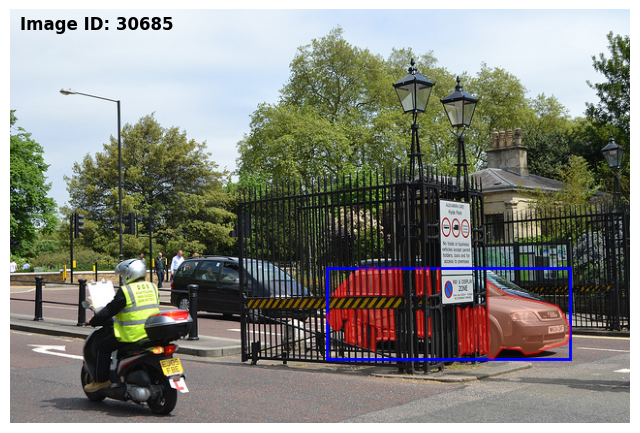

Annotation ID: 158457


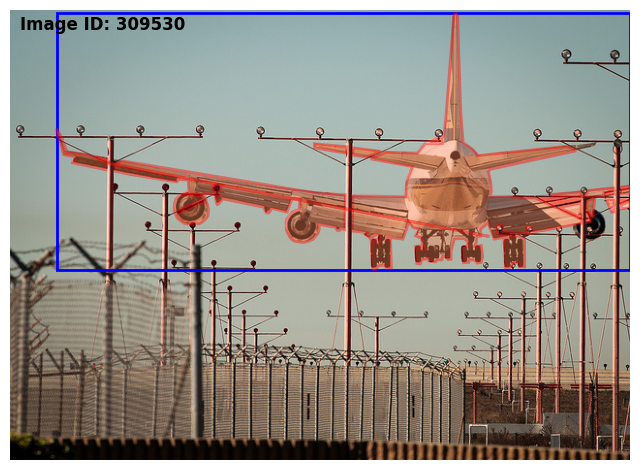

Annotation ID: 1785487


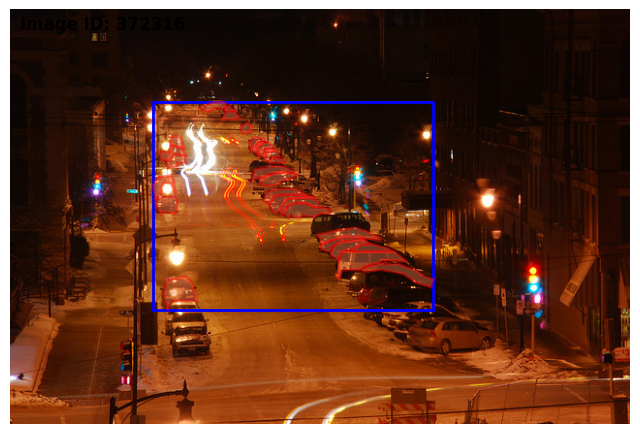

Annotation ID: 42852


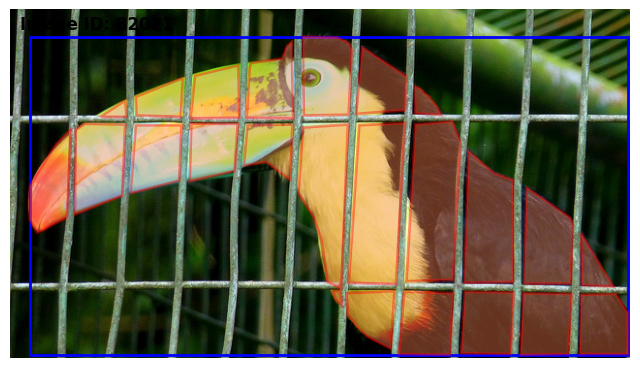

Annotation ID: 2210434


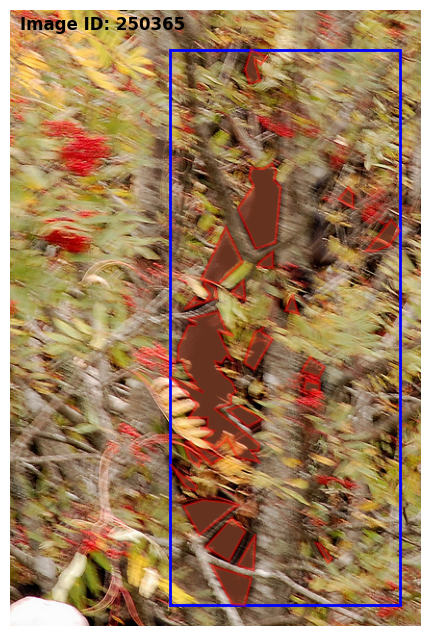

Annotation ID: 1449315


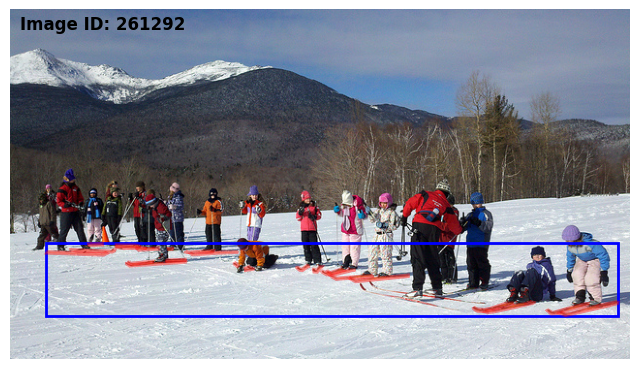

Annotation ID: 1911052


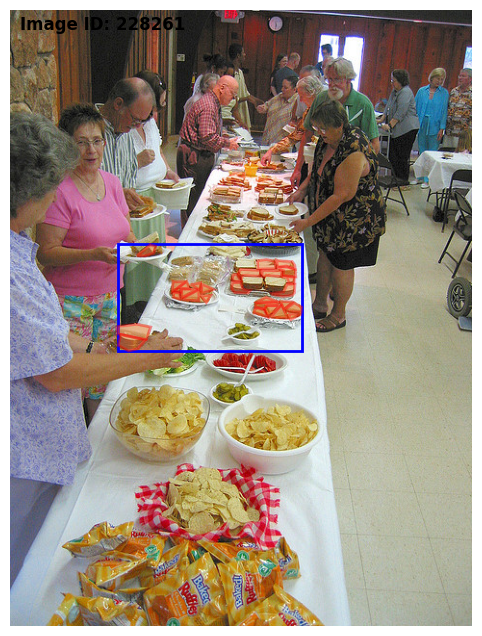

Annotation ID: 65421


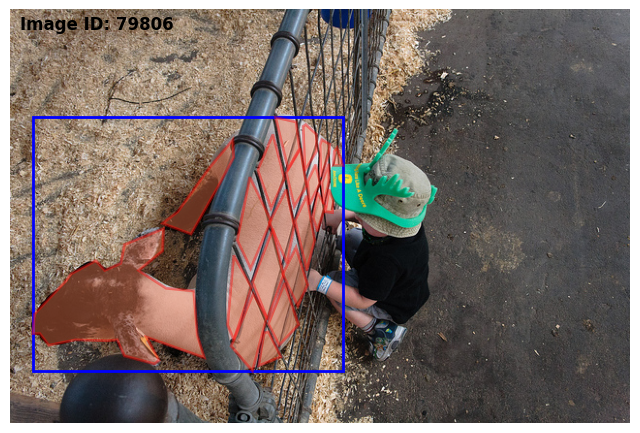

Annotation ID: 235245


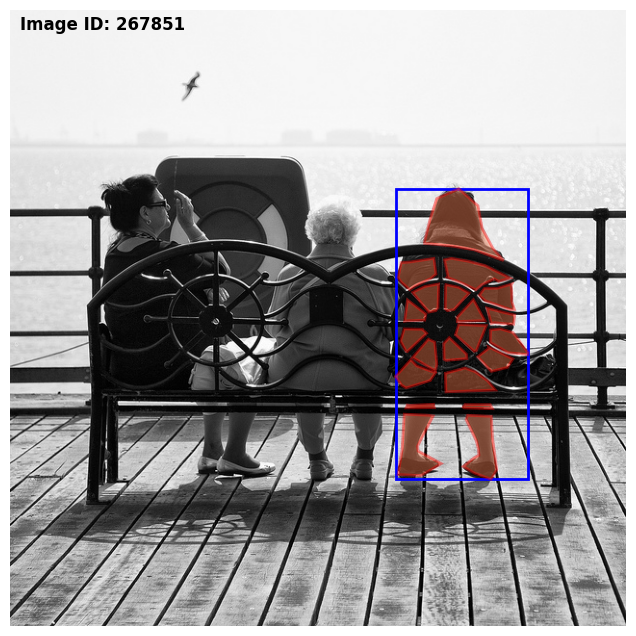

Annotation ID: 370113


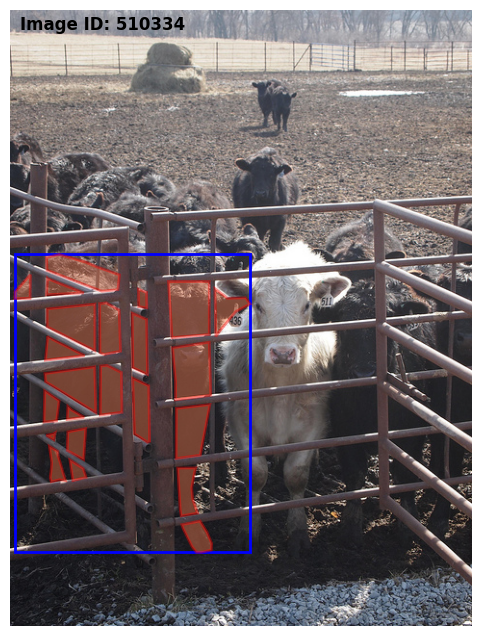

Annotation ID: 1200602


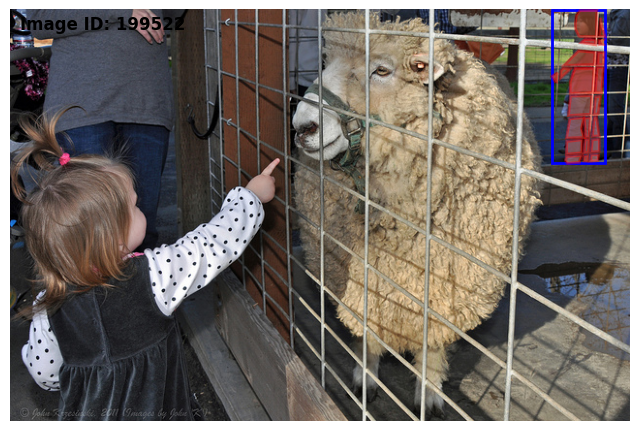

Annotation ID: 1478646


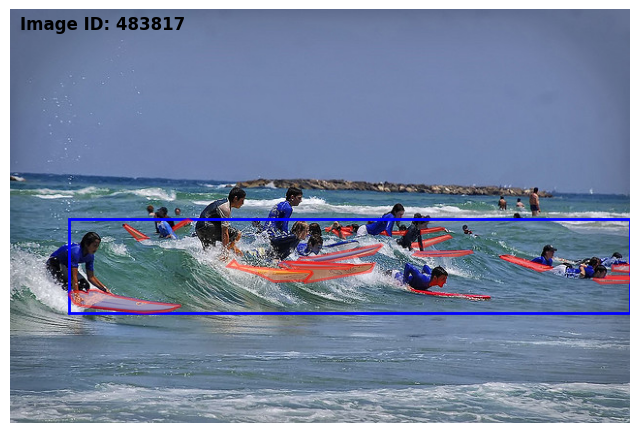

Annotation ID: 1480958


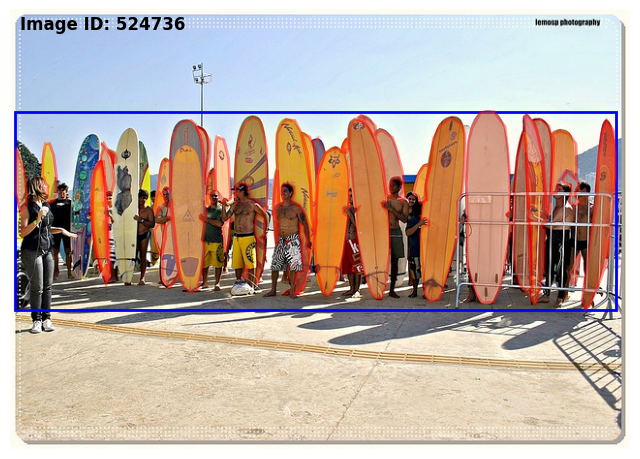

In [91]:
# Some wierd examples that have segmentations masks of over 30 parts
for a in annotations:
    if len(a['segmentation']) > 20:
        print("Annotation ID:", a['id'])
        plot_annotation(a['id'])

# SEGM near edges ± 5px 

In [20]:
def get_area_overlap(annotation, px=5):
    img = coco.loadImgs(annotation['image_id'])[0]  # Get image
    height, width = img['height'], img['width']
    
    segmentation_mask = coco.annToMask(annotation) # Create the binary mask for the segmentation
    
    # Create the binary mask for the frame
    frame_mask = np.zeros((height, width), dtype=np.uint8)
    frame_mask[:px, :] = 1  # Top frame
    frame_mask[-px:, :] = 1  # Bottom frame
    frame_mask[:, :px] = 1  # Left frame
    frame_mask[:, -px:] = 1  # Right frame
    
    # Calculate the intersection of the segmentation mask and the frame mask
    intersection_mask = np.logical_and(segmentation_mask, frame_mask)
    
    # Compute the area of the intersection
    intersection_area = np.sum(intersection_mask)
    
    # Compute percentage of the 5px frame that is intersected by the segmentation mask
    percentage = (intersection_area /  np.sum(frame_mask)) * 100
    
    return intersection_area, percentage

def check_segm_edges(annotation, thres=5, percentage_thres=5):
    area_overlap, percentage = get_area_overlap(annotation, thres)
    print(area_overlap, percentage)
    return percentage < percentage_thres

In [414]:
# Multi-threaded
def process_annotation(annotation):
    return get_area_overlap(annotation, px=5)

# Multi-threaded computation of area overlaps
def compute_area_overlaps_multithreaded(annotations, num_threads=multiprocessing.cpu_count()):
    with concurrent.futures.ThreadPoolExecutor(max_workers=num_threads) as executor:
        # Using list comprehension with tqdm for progress bar
        results = list(tqdm(executor.map(process_annotation, annotations), total=len(annotations)))
    return results

# Example usage
area_overlaps = compute_area_overlaps_multithreaded(annotations)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 860001/860001 [07:54<00:00, 1812.25it/s]


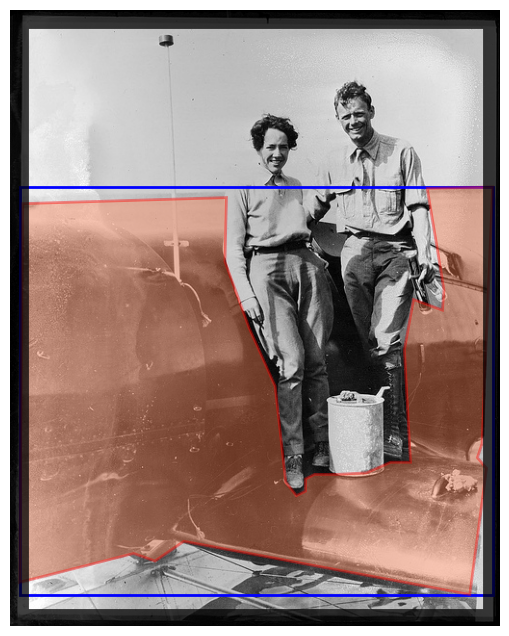

In [77]:
ann = coco.loadAnns([1793370])[0]
img = coco.loadImgs(ann['image_id'])[0]

I = io.imread(img['coco_url'])
plt.figure(figsize=(8, 8))
plt.imshow(I)
x, y, width, height = ann['bbox']
rect = plt.Rectangle((x, y), width, height, edgecolor='blue', facecolor='none', linewidth=2)
plt.gca().add_patch(rect)
for segmentation in ann['segmentation']:
    poly = np.array(segmentation).reshape((int(len(segmentation) / 2), 2))
    mask = patches.Polygon(poly, facecolor='coral', edgecolor='red', linewidth=2, alpha=0.4)
    plt.gca().add_patch(mask)
frame_width = 15  # width of the frame
image_height, image_width = I.shape[:2]
inner_frame = plt.Rectangle(
    (frame_width / 2, frame_width / 2), image_width - frame_width, image_height - frame_width,
    edgecolor='black', facecolor='none', linewidth=frame_width, alpha=0.75)
plt.gca().add_patch(inner_frame)
plt.axis('off')
plt.show()

In [78]:
check_segm_edges(ann, thres=15)

2154 6.4164432529043784


False

In [73]:
print("If True, we consider the image")
print(ann['area'] < (img['height']*img['width']*60/100) , "occupies", ann['area'] / (img['height']*img['width']) * 100)

If True, we consider the image
True occupies 41.477093888138505


In [63]:
img

{'license': 3,
 'file_name': '000000324342.jpg',
 'coco_url': 'http://images.cocodataset.org/train2017/000000324342.jpg',
 'height': 640,
 'width': 509,
 'date_captured': '2013-11-16 03:47:41',
 'flickr_url': 'http://farm4.staticflickr.com/3101/5734004471_647ef692db_z.jpg',
 'id': 324342}

### Get all area overlaps for statistical analysis

In [421]:
# Single thread
# area_overlaps = [get_area_overlap(ann, px=5) for ann in tqdm(annotations)]

In [437]:
area = [a[0] for a in area_overlaps if a[0] != 0]
percent = [a[1] for a in area_overlaps if a[1] != 0]

(0.0, 500.0)

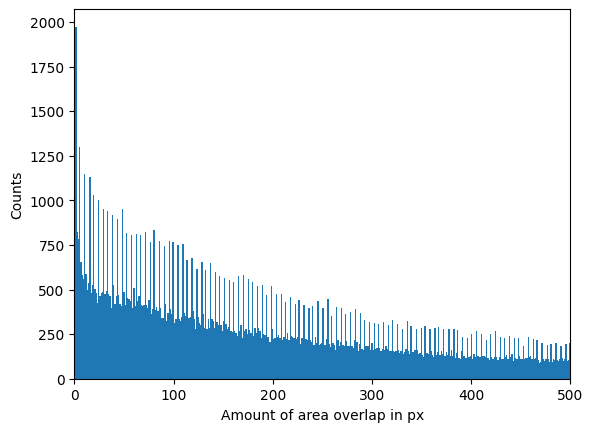

In [453]:
plt.hist(area, bins=10000)
plt.xlabel("Amount of area overlap in px")
plt.ylabel("Counts")
plt.xlim(0,500)

(0.0, 30.0)

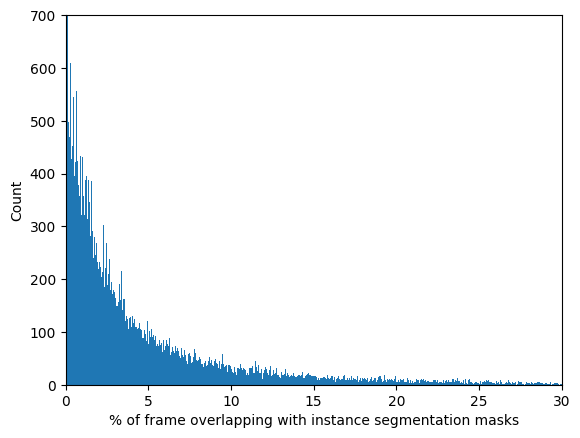

In [446]:
plt.hist(percent, bins=10000)
plt.ylabel("Count")
plt.xlabel("% of frame overlapping with instance segmentation masks")
plt.ylim(0,700)
plt.xlim(0,30)

(0.0, 5.0)

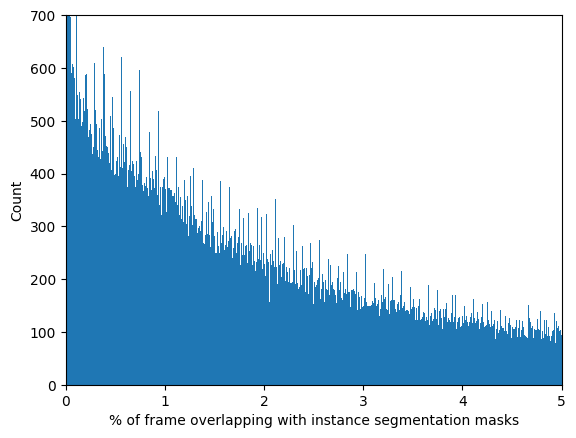

In [452]:
plt.hist(percent, bins=10000)
plt.ylabel("Count")
plt.xlabel("% of frame overlapping with instance segmentation masks")
plt.ylim(0,700)
plt.xlim(0,5)

# BBOX near edges ± 5px 
When the BBOX is too close to the edges, it usually means that the object is not complete in the image

In [23]:
def check_bbox_edges(annotation, thres=1):
    img = coco.loadImgs(annotation['image_id'])[0] # Get image
    height, width = img['height'], img['width']
    bbox = convert_bbox_coco_to_x1x2y1y2(annotation['bbox']) # [x1, y1, x2, y2]
    if bbox[0] < thres or bbox[1] < thres \
        or bbox[2] > width-thres or bbox[3] > height-thres:
        return False
    return True

In [44]:
check_bbox_edges(coco.loadAnns([317078])[0], thres=25)

False

In [357]:
for thres in [0.01, 0.1, 0.5, 1, 2, 3, 4, 5]:
    large_bboxes = [ann['id'] for ann in annotations if not check_bbox_edges(ann, thres)]
    print(f"Threshold {thres}px. Num too large bboxes: {len(large_bboxes)} of {len(annotations)}. Ratio: {len(large_bboxes)/len(annotations)}.")

Threshold 0.01px. Num too large bboxes: 107906 of 860001. Ratio: 0.12547194712564289.
Threshold 0.1px. Num too large bboxes: 111737 of 860001. Ratio: 0.12992659310861265.
Threshold 0.5px. Num too large bboxes: 125533 of 860001. Ratio: 0.14596843492042452.
Threshold 1px. Num too large bboxes: 139736 of 860001. Ratio: 0.16248353199589302.
Threshold 2px. Num too large bboxes: 160537 of 860001. Ratio: 0.18667071317358933.
Threshold 3px. Num too large bboxes: 170306 of 860001. Ratio: 0.198030002290695.
Threshold 4px. Num too large bboxes: 177094 of 860001. Ratio: 0.20592301636858562.
Threshold 5px. Num too large bboxes: 186567 of 860001. Ratio: 0.21693811983939554.


In [ ]:
large_bboxes = [ann['id'] for ann in annotations if not check_bbox_edges(ann, thres=1)]

Annotation id: 231756


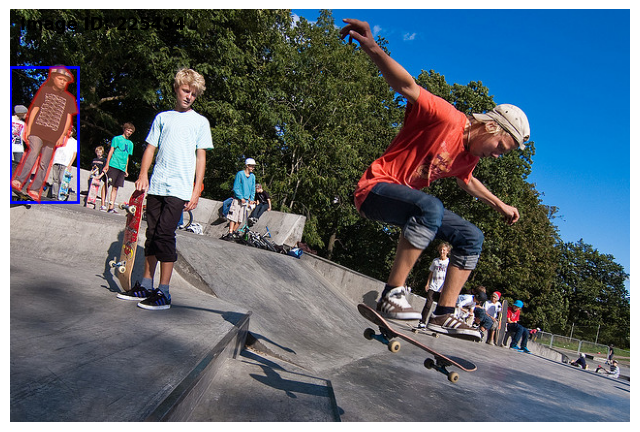

Annotation id: 231764


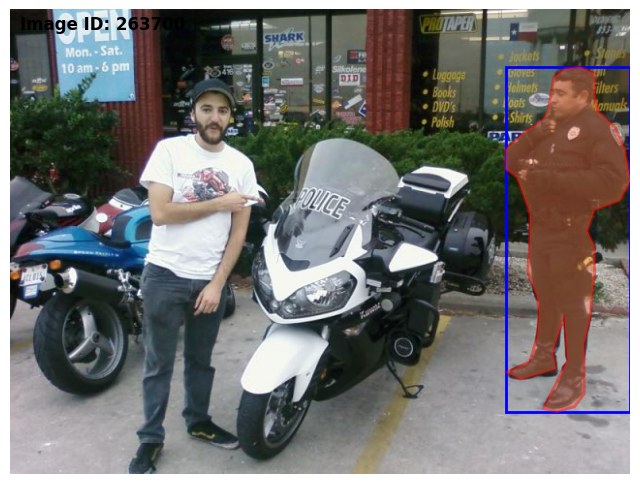

Annotation id: 232163


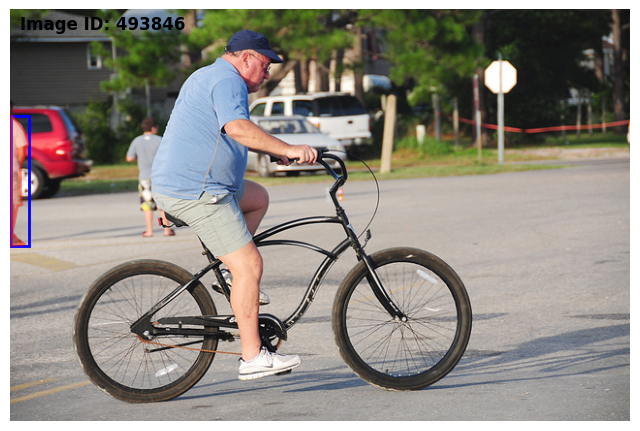

Annotation id: 232365


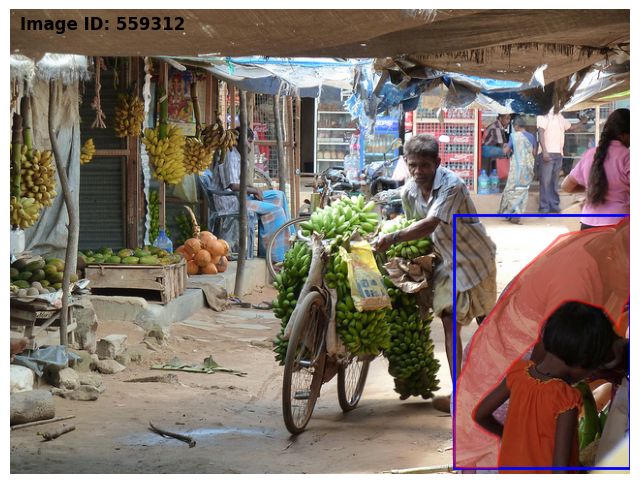

Annotation id: 233275


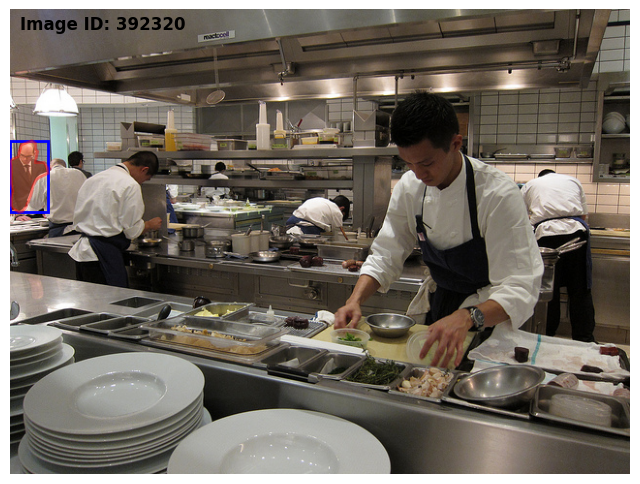

Annotation id: 233359


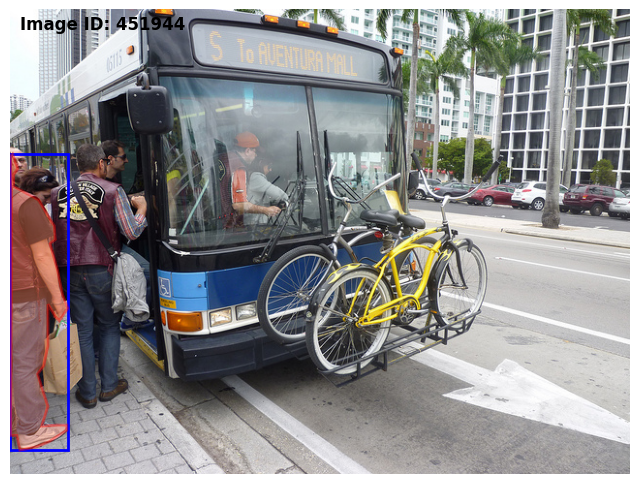

Annotation id: 234114


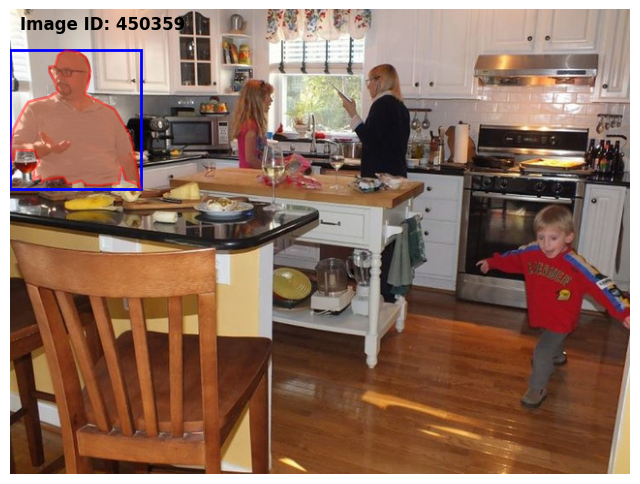

Annotation id: 234232


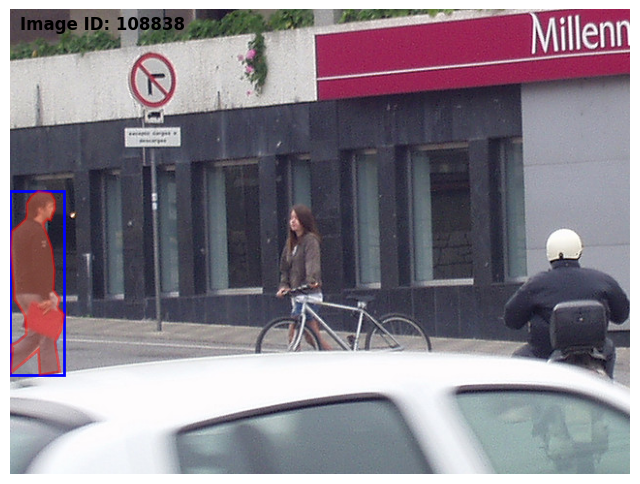

Annotation id: 234689


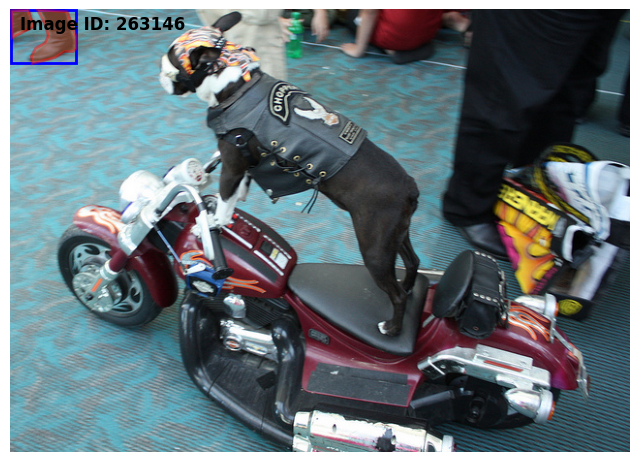

Annotation id: 235604


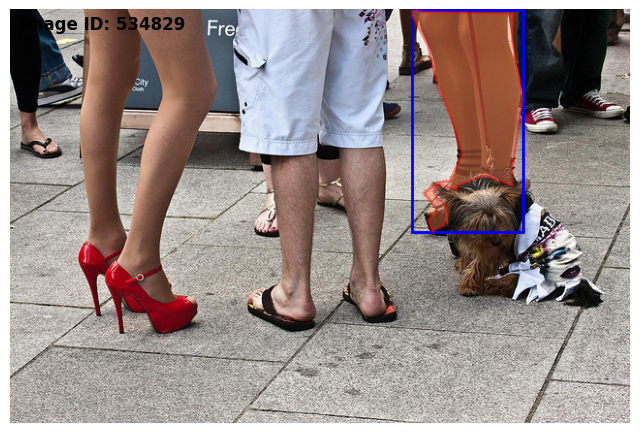

Annotation id: 236505


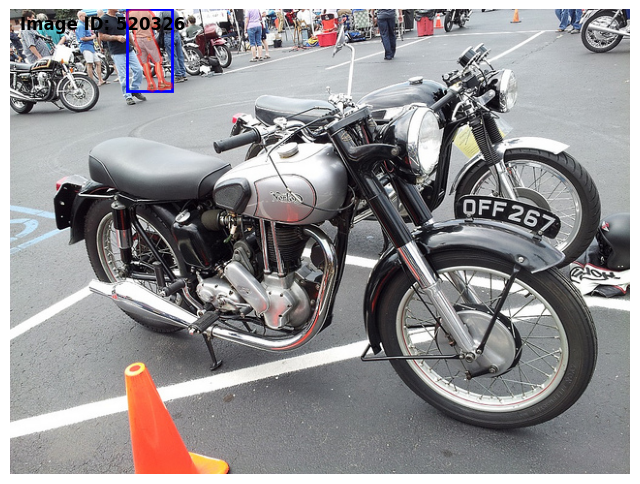

Annotation id: 236566


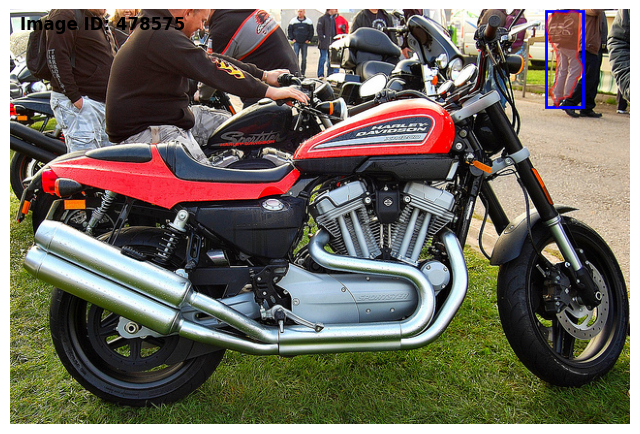

Annotation id: 236971


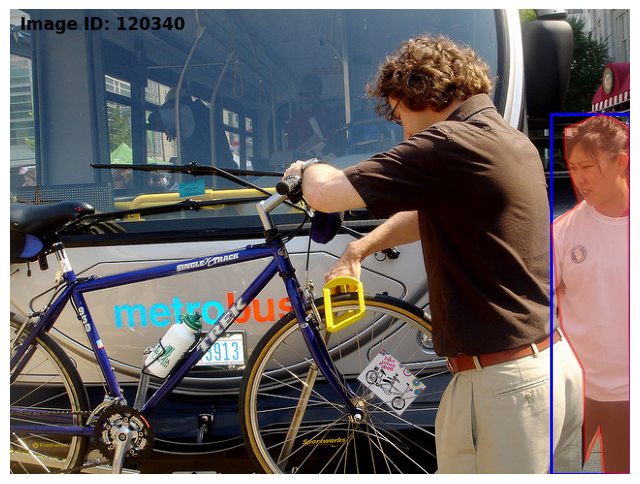

Annotation id: 237188


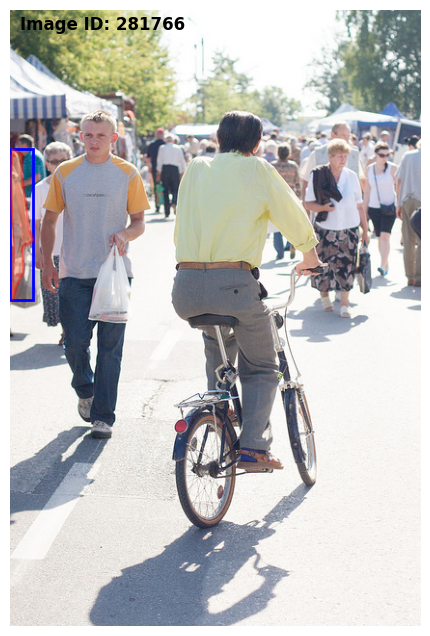

In [459]:
for ann_id in large_bboxes[750:764]:
    print("Annotation id:", ann_id)
    plot_annotation(ann_id)